---

<center> <h1> Gradient Descent Algorithm in Python </h1>

---

**`Use Print Preview to view Output without running each cell`**

## Data Description

Consider the following 3 datapoints: 

| **X1  (Feature)** | **Y  (Target)** |
|:-----------------:|:---------------:|
|         1         |       4.8       |
|         3         |       12.4      |
|         5         |       15.5      |

Here,

**X1** refers to the independent variable (also called as Feature / Attribute in Machine Learning)

**Y** is the dependent variable (also known as Target Variable in ML)

<img src="best_fit_line.JPG">

- The following plot shows these 3 datapoints in Blue circles. Also shown is the red-line (with squares), which we are claiming is the **“best-fit line”**.
- The claim is that this best fit-line will have the minimum error for prediction (the predicted values are actually the red-squares, hence the vertical difference is the error in prediction).
- This total difference (error) across all the datapoints is expressed as the Mean Squared Error Function, which will be minimized using the Gradient Descent Algorithm, discussed below.
- Minimizing or maximizing any quantity is mathematically referred as an Optimization Problem, and hence the solution (the point where the minima/maxima exists) is referred the **“optimal values”**.
- You can easily see that the yellow-line (a poor-fit line) which has “non-optimal” values of slope & intercept fits the data very badly (btw the exact equation of the yellow line is x+6, so slope is 1 and intercept is 6 units)

The net Objective is to find the Equation of the Best-Fitting Straight Line (through these 3 data points, mentioned in the above table, also represented by the blue circles in the above plot).

---

$$
\hat{Y} = w_0 + w_1X_1 \quad \text{is the equation of the best-fit line (red-line in the plot) where}
$$ 

---



$$ 
w_1 = \quad \text{slope of the line;} 
$$ 

$$ 
w_0  = \quad \text{intercept of the line} 
$$

$$ 
w_0 , w_1 \quad \text{are also called model weights}
$$

$$ 
\hat{Y} \quad \text {is the predicted values of Y, given by the “best-fit line”.}
$$ 

These predicted values are represented by red-squares on the red-line. Of course, the predicted values are NOT exactly same as the actual values of Y (blue circles), the vertical difference represents the error in the prediction given by:

$$ 
Error_i = \hat{Y}_i - Y_i \quad \text{for any ith data points} 
$$ 

$$
MSE = \frac{1}{N}\sum_{i=1}^{N}(Error_i)^2= \frac{1}{N}\sum_{i=1}^{N}(\hat{Y}_i - Y_i)^2
\quad \text{where N = Total no. of data points. For this question, N=3}
$$

## Problem Statement

To find the **“optimal values”** of the slope and intercept of this best-fit line, such that the **“Mean Squared Error” (MSE)** is minimum. 

Also, **Plot the following:**
- 1. MSE Loss function (y-axis) vs w0 (x-axis)
- 2. MSE Loss function (y-axis) vs w1 (x-axis)
- 3. 3D-plot of Loss function w.r.t. w0 & w1
- 4. w0 (y-axis) vs Iteration (x-axis)
- 5. w1 (y-axis) vs Iteration (x-axis)
- 6. Loss function (y-axis) vs iteration (x-axis)

## Approach
#### How will i get the optimal values of the slope and intercept ?

This is where the Gradient Descent Algorithm comes!

$$
w^{k+1}_0 = w^{k}_0 - (\alpha\sum_{i=1}^{N}(\hat{Y}_i - Y_i))
$$

$$
w^{k+1}_1 = w^{k}_1 - (\alpha\sum_{i=1}^{N}[(\hat{Y}_i - Y_i)*X_1i])
$$

where 
$$ 
w^{k}_0 , w^{k}_1 \quad \text{represent the values of the intercept and the slope of the linear-fit
in the kth iteration} 
$$
and
$$
w^{k+1}_0, w^{k+1}_1 \quad \text{represent the values of the intercept and the slope of the linear-fit in the (k+1)th iteration (next iteration)}
$$

$$
w_0 , w_1 \quad \text{are also called model weights or model coefficients and}
$$

$$
\alpha \quad \text{represents the Learning Rate}
$$

<img src="gradient_descent.JPG">

### Gradient Descent Algorithm

- 1. Initialize the algorithm with random values of α, and weights (w0 , w1)

- 2. Calculate predictions 
$$
\hat{Y} = w_0 + w_1X_1
$$ 
- 3. Calculate Error terms & MSE Loss Function (L).
  > Error Terms are:
  $$
  \sum_{i=1}^{N}\hat{Y}_i - Y_i \quad \text{and}
  $$

  $$
  \sum_{i=1}^{N}[(\hat{Y}_i - Y_i)*X_1i]
  $$

  $$
  \quad \text{for data points i=1 to N. Here N=3}
  $$
  
  > and Loss Function as:
  $$
  MSE = \frac{1}{N}\sum_{i=1}^{N}(Error_i)^2= \frac{1}{N}\sum_{i=1}^{N}(\hat{Y}_i - Y_i)^2
  $$

  $$
  \quad \text{where N = Total no. of data points. Here N=3}
  $$
  
- 4. Update your weights using model coefficients equation
- 5. Repeat 2-4, until convergence.

Based on the above-mentioned steps, we can calculate the weights. Let the learning rate (α) be 0.01 and initialize the weights w0 and w1 as 0.

---
## Solution
---

We can solve this problem in two ways:
- **Method-1:** Fixed number of iterations using **for loop** as convergence limit.
- **Method-2:** Limit Loss Difference < 0.001 using **while loop** as convergence limit.

#### Getting system ready and defining the given data points

In [2]:
# Importing libraries
import numpy as np
import pandas as pd

In [3]:
# Define the given data points
X1 = np.array([1, 3, 5])
Y = np.array([4.8, 12.4, 15.5])

In [4]:
X1, Y

(array([1, 3, 5]), array([ 4.8, 12.4, 15.5]))

#### Defining required  function

Since, Loss Function is given as:
$$
MSE = \frac{1}{N}\sum_{i=1}^{N}(Error_i)^2= \frac{1}{N}\sum_{i=1}^{N}(\hat{Y}_i - Y_i)^2
$$
$$
\quad \text{where N = Total no. of data points. Here N=3}
$$



In [5]:
# Define the Loss function i.e Mean Squared Error (MSE)
def mse(Y, Y_pred):
    return np.mean((Y_pred-Y)**2)

In [6]:
# Define the initial values of w0 and w1
w0 = 0
w1 = 0

In [7]:
# Define the learning rate
alpha = 0.01

### `Method-1:` Fixed number of iterations using for loop as convergence limit

In [8]:
# Define a list to store the data for each iteration
iteration_data = []

In [9]:
# Define the number of iterations
total_iterations = 500

In [10]:
total_iterations

500

In [11]:
# Start the iteration
for iteration_no in range(total_iterations):
    Y_pred = w0 + w1 * X1
    Error = Y_pred - Y
    Error_Weighted = Error*X1
    Error_Sum = np.sum(Error)
    Error_Weighted_Sum = np.sum(Error * X1)
    Loss = mse(Y, Y_pred)
    w0 = w0 - alpha * Error_Sum
    w1 = w1 - alpha * Error_Weighted_Sum
    
    # Store the data for each iteration
    iteration_data.append([iteration_no, w0, w1, Y_pred, Error, Error_Weighted, Error_Sum, Error_Weighted_Sum, Loss])

# Convert the data to a pandas data frame
data = pd.DataFrame(iteration_data, columns=['iteration_no', 'w0', 'w1', 'Y_pred', 'Error', 'Error_Weighted', 'Error_Sum', 'Error_Weighted_Sum', 'Loss'])


In [12]:
data

,iteration_no,w0,w1,Y_pred,Error,Error_Weighted,Error_Sum,Error_Weighted_Sum,Loss
0,0,0.327000,1.195000,"[0, 0, 0]","[-4.8, -12.4, -15.5]","[-4.8, -37.2, -77.5]",-32.700000,-119.500000,139.016667
1,1,0.536640,1.942320,"[1.522, 3.912, 6.3020000000000005]","[-3.2779999999999996, -8.488, -9.198]","[-3.2779999999999996, -25.464, -45.99]",-20.964000,-74.732000,55.798211
2,2,0.672732,2.409210,"[2.47896, 6.3636, 10.248240000000001]","[-2.32104, -6.0364, -5.251759999999999]","[-2.32104, -18.1092, -26.258799999999994]",-13.609200,-46.689040,23.135445
3,3,0.762721,2.700441,"[3.0819424, 7.9003632, 12.718784]","[-1.7180575999999999, -4.4996368, -2.781216000...","[-1.7180575999999999, -13.4989104, -13.9060800...",-8.998910,-29.123048,10.311205
4,4,0.823800,2.881642,"[3.4631619840000005, 8.864043744000002, 14.264...","[-1.3368380159999993, -3.5359562559999986, -1....","[-1.3368380159999993, -10.607868767999996, -6....",-6.107869,-18.120079,5.271844
...,...,...,...,...,...,...,...,...,...
495,495,2.791795,2.696796,"[5.488193826765308, 10.882066783357448, 16.275...","[0.6881938267653078, -1.517933216642552, 0.775...","[0.6881938267653078, -4.553799649927656, 3.879...",-0.053800,0.014093,1.126605
496,496,2.792330,2.696656,"[5.488590894498728, 10.882181993559158, 16.275...","[0.688590894498728, -1.5178180064408426, 0.775...","[0.688590894498728, -4.553454019322528, 3.8788...",-0.053454,0.014002,1.126584
497,497,2.792861,2.696516,"[5.488985411309212, 10.882296463604156, 16.275...","[0.6889854113092122, -1.5177035363958442, 0.77...","[0.6889854113092122, -4.553110609187533, 3.878...",-0.053111,0.013912,1.126564
498,498,2.793389,2.696378,"[5.489377393584915, 10.882410198247516, 16.275...","[0.6893773935849152, -1.517589801752484, 0.775...","[0.6893773935849152, -4.552769405257452, 3.877...",-0.052769,0.013823,1.126544


### Inference

Based on the Gradient Descent algorithm steps, we have calculated the weights considering **learning rate (α)** to be **0.01** and initialized the weights **w0 and w1 as 0** for **500 number of iterations**.

As we can see, the sum of errors is decreasing as we are updating the weights. We can continue to update the weights like the above manner until the **sum of errors** become **minimum** (i.e. reaches almost a **constant value**)



### `Method-2:` Limit Loss Difference < 0.001 using while loop as convergence limit

Likewise, method-1 we can use while loop and consecutive loss difference less than 0.001 as the convergence limit. Here we are not performing method-2 iteration.

## Gradient Descent Optimization Visualization

In [13]:
# Importing libraries for Visualization
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px

### `1. MSE Loss function (Y-axis) Vs w0 (Y-axis)`

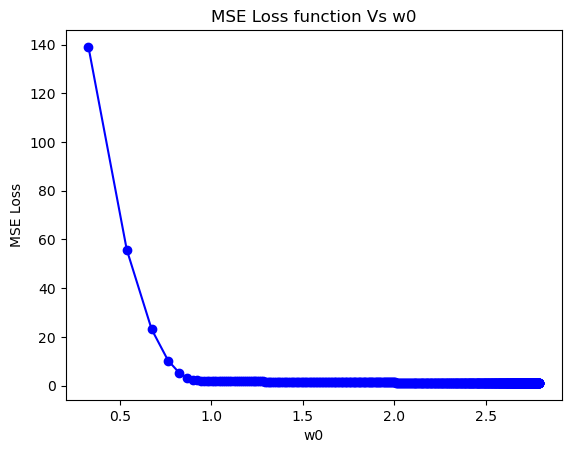

In [14]:
# Plotting static chart - MSE loss vs w0
plt.plot(data['w0'],data['Loss'], 'bo-')
plt.xlabel('w0')
plt.ylabel('MSE Loss')
plt.title('MSE Loss function Vs w0')
plt.show()

# Plotting interactive chart - MSE loss vs w0
fig = px.line(data, x='w0', y='Loss', markers=True)
fig.update_layout(title='MSE Loss function Vs w0', xaxis_title='w0', yaxis_title='MSE Loss')
fig.show()

### `2. MSE Loss function (Y-axis) vs w1 (X-axis)`

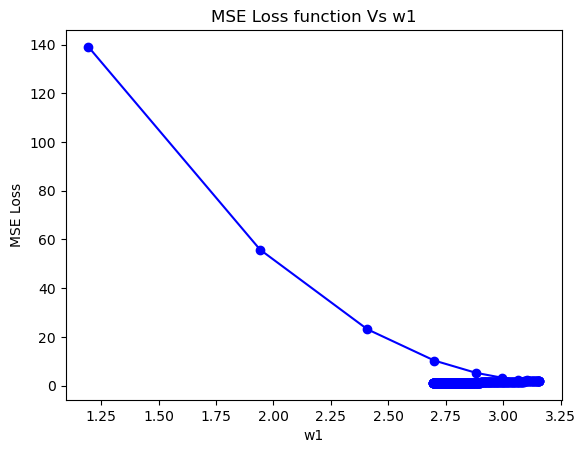

In [15]:
# Plotting static chart - MSE loss vs w1
plt.plot(data['w1'],data['Loss'], 'bo-')
plt.xlabel('w1')
plt.ylabel('MSE Loss')
plt.title('MSE Loss function Vs w1')
plt.show()

# Plotting interactive chart - MSE loss vs w1
fig = px.line(data, x='w1', y='Loss', markers=True)
fig.update_layout(title='MSE Loss function Vs w1', xaxis_title='w1', yaxis_title='MSE Loss')
fig.show()

### `3. 3D-plot of MSE Loss function w.r.t. w0 & w1`

- It is important to note here that to create a **3D Surface plot** of MSE Loss function w.r.t w0 and w1 we need w0, w1 and Loss to be 2D array. So, first is to convert these varaibles into 2D array.

In [16]:
# Converting w0, w1 and Loss pandas dataframe to 1D array
x = np.array(data['w0'])
y = np.array(data['w1'])
z = np.array(data['Loss'])

In [17]:
# checking shape
x.shape, y.shape, z.shape

((500,), (500,), (500,))

In [18]:
# Converting 2D grid points from w0 and w1
X, Y = np.meshgrid(x, y)

In [19]:
# Checking shape
X.shape, Y.shape

((500, 500), (500, 500))

In [20]:
# Converting 2D Loss array
Z = np.tile(z,(500,1))

In [21]:
# Checking shape
Z.shape

(500, 500)

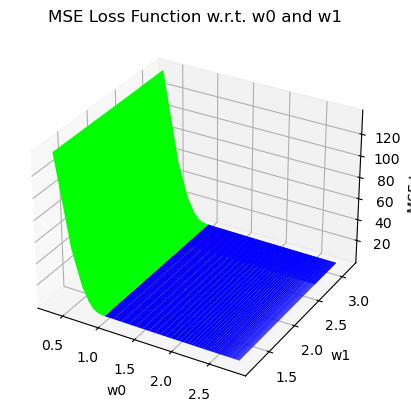

In [22]:
# Plotting static chart - MSE Loss Function w.r.t w0 and w1
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, cmap='brg')  # X=w0, Y=w1 and Z=Loss
ax.set_xlabel('w0')
ax.set_ylabel('w1')
ax.set_zlabel('MSE Loss')
plt.title('MSE Loss Function w.r.t. w0 and w1')
plt.show()

In [23]:
# Plotting interactive chart - MSE Loss Function w.r.t w0 and w1

import plotly.graph_objs as go

fig = go.Figure(data=[go.Surface(x=X, y=Y, z=Z)])  # X=w0, Y=w1 and Z=Loss

fig.update_layout(title='MSE Loss function w.r.t w0 and w1', xaxis_title='w0', yaxis_title='w1' )
fig.show()

### `4. w0 (Y-axis) Vs Iteration (X-axis)`

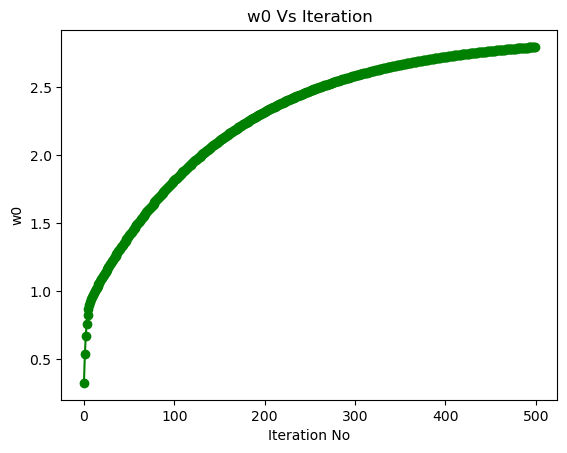

In [24]:
# Plotting static chart - w0 vs iteration
plt.plot(data['iteration_no'], data['w0'], 'go-')
plt.xlabel('Iteration No')
plt.ylabel('w0')
plt.title('w0 Vs Iteration')
plt.show()

# Plotting interactive chart - w0 vs iteration
fig = px.line(data, x='iteration_no', y='w0', markers=True)
fig.update_layout(title='w0 Vs Iteration', xaxis_title='Iteration No', yaxis_title='w0')
fig.show()

### `5. w1 (Y-axis) Vs Iteration (X-axis)`

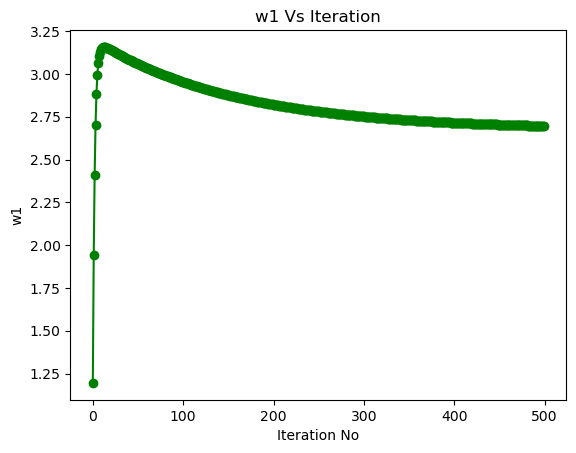

In [25]:
# Plotting static chart - w1 vs iteration
plt.plot(data['iteration_no'], data['w1'], 'go-')
plt.xlabel('Iteration No')
plt.ylabel('w1')
plt.title('w1 Vs Iteration')
plt.show()

# Plotting interactive chart - w1 vs iteration
fig = px.line(data, x='iteration_no', y='w1', markers=True)
fig.update_layout(title='w1 Vs Iteration', xaxis_title='Iteration No', yaxis_title='w1')
fig.show()

### `6. MSE Loss function (Y-axis) Vs Iteration (X-axis)`

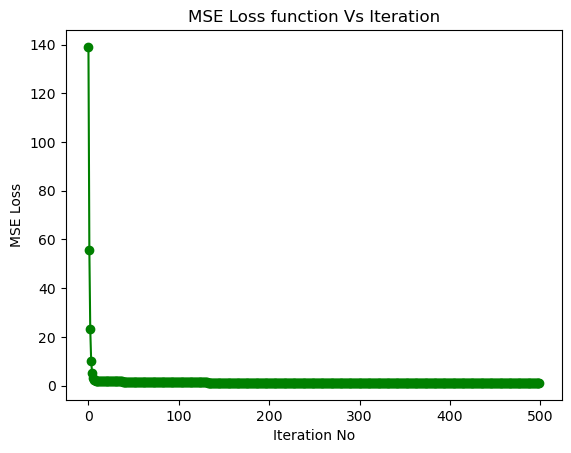

In [27]:
# Plotting static chart - MSE Loss vs iteration
plt.plot(data['iteration_no'], data['Loss'], 'go-')
plt.xlabel('Iteration No')
plt.ylabel('MSE Loss')
plt.title('MSE Loss function Vs Iteration')
plt.show()

# Plotting interactive chart - MSE Loss vs iteration
fig = px.line(data, x='iteration_no', y='Loss', markers=True)
fig.update_layout(title='MSE Loss function Vs Iteration', xaxis_title='Iteration No', yaxis_title='MSE Loss')
fig.show()

---

<center><h3> *****Ends Here*****</h3>

    
---